In [45]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [46]:
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import cv2
from scipy import linalg
import json
import glob
import plotly.express as px
from lk_helper import *
from harris_helper import *
from copy import deepcopy

### Function to compute Average End Point Error

In [47]:
def compute_average_end_point_error(ground_truth, u, v):
    ans=0
    h,w=u.shape
    UNKNOWN_FLOW_THRESH = 1e7
    for i in range(h):
        for j in range(w):
            v2,v1=ground_truth[i][j]
            if (abs(v1)>UNKNOWN_FLOW_THRESH) | (abs(v2)> UNKNOWN_FLOW_THRESH):
                continue
            if (abs(u[i][j])>UNKNOWN_FLOW_THRESH) | (abs(v[i][j])> UNKNOWN_FLOW_THRESH):
                continue
            
            add=(v1-u[i][j])**2+(v2-v[i][j])**2
            
            if add>100:
                #print(v1,v2,add)
                pass
            ans+=math.sqrt(add)
    #rint("final add is ", add)
    ans=ans/(h*w)
    return ans

##### A small utility function

In [48]:
def normal_num(num):
    if num<10:
        ret=f"0{num}"
    else:
        ret=str(num)
    return ret

#### Plots arrows on the image

In [49]:
def fetch_quiver_plot_2(colored_image, u,v, pts, scale=50, save_path=None):
    h,w=colored_image.shape[0], colored_image.shape[1]
    f = plt.imshow(colored_image)
    ax=f.axes
    u=np.multiply(u,scale)
    v=np.multiply(v,scale)
    done=False
    # print(u.shape)
    # print(colored_image.shape)
    #print(pts[0])
    for t in pts:
        i=t[0][0]
        j=t[0][1]
        ax.arrow(i,j,u[j,i],v[j,i],head_width = 7, head_length = 5, color = (1,0,0))
    plt.rcParams["figure.figsize"] = (10,10)
    plt.show()
    if save_path is not None:
        plt.savefig(save_path)

In [50]:
def plot_visuals(colored_image, u, v, sent_skip_gap=10):
    fig = plt.figure(figsize=(30,30))
    
    u_norm=fetch_normalized_matrix(u)
    v_norm=fetch_normalized_matrix(v)
    magnitude_norm=fetch_normalized_matrix(np.sqrt(u*u+v*v))
    
    ##################################
    ax = fig.add_subplot(2,2,1)
    ax.imshow(magnitude_norm,cmap='gray')
    ax.set_title("Magnitude norm PLOT", fontsize=30)
    ax.axis('on')
    ##################################
    ax = fig.add_subplot(2,2,2)
    ax.set_title("Quiver plot throught the image", fontsize=30)
    fetch_overall_quiver_plot(colored_image,u,v,SKIP_GAP=sent_skip_gap)
    ax.axis('on')
    ################################
    ax = fig.add_subplot(2,2,3)
    ax.imshow(u_norm,cmap='gray')
    ax.set_title("Norm of horizontal velocity", fontsize=30)
    ax.axis('on')
    #############################    
    ax = fig.add_subplot(2,2,4)
    ax.imshow(v_norm,cmap='gray')
    ax.set_title("Norm of Vertical velocity", fontsize=30)
    ax.axis('on')
    ###############################
    plt.show()

In [51]:
def entire_pipeline(picture_type, lb_frame,ub_frame,window_sz=11,sum_mode='avg', recv_sigma_val=-1):
    
    print("Picture category is ", picture_type)
    print("WINDOW SIZE IS ", window_sz)
    print("Mode used to sum pixel contributions in the gradient covariance matrix is ", sum_mode)
    print("Sigma value being used (-1 in case MODE is NOT gaussian): ", recv_sigma_val)
    
    file_path=f"../../data/ground-truth-flow/{picture_type}/flow10.flo"
    #flow_data=read_flow(file_path)
    #show_flow(file_path)
    #print("flow data read")
    path_to_folder=f"/home/anmolagarwal/Desktop/cv_assignment_2/data/all-frames-colour/{picture_type}"
    image_path_1=path_to_folder+f"/frame{normal_num(lb_frame)}.png"
    image_path_2=path_to_folder+f"/frame{normal_num(lb_frame+1)}.png"
    image_1=fetch_image(image_path_1)
    image_2=fetch_image(image_path_2)
    
    ############################
    print("LK method applied")
    u, v, eigens = apply_lk_algo(fetch_image(image_path_1),
                                 fetch_image(image_path_2),
                                 [window_sz,window_sz],
                                sum_mode=sum_mode, recv_sigma_val=recv_sigma_val)
    
    col=compute_color(u,v).astype(int)
    plt.imshow(col)
    plt.show()
    ###################################
    # params for ShiTomasi corner detection
    
    with open(f"{picture_type}_corners_by_harris.json",'r') as fd:
        corners=json.load(fd)
        corners=np.array(corners)
    
    #######################################
    prefix_path=f"./saved_data/{picture_type}/frame_{lb_frame}_window_size_{window_sz}_{sum_mode}_{recv_sigma_val}"
    print("prefix path is ", prefix_path)
    print("hsv flow image being saved")
    
    print("Displaying the flow at corners only")
    plt.imsave(f"{prefix_path}_flow_hsv.jpg",col.astype(np.uint8))
    fetch_quiver_plot_2(fetch_image(image_path_1, True), u,v,corners, save_path=f"{prefix_path}_arrows.jpg")
    print("quiver plot saved")
    plt.cla() 
    plt.clf()
    #err=compute_average_end_point_error(flow_data, u, v)
    #print("Error is ", err)
    #print("####################################")
    plot_visuals(fetch_image(image_path_1,True),u,v)
    
    

In [52]:
def entire_pipeline_pyramidal(picture_type, lb_frame,ub_frame,window_sz=11,num_levels=3):
    
    print("Picture category is ", picture_type)
    print("WINDOW SIZE IS ", window_sz)
    print("Number of levels is ", num_levels)
    
    file_path=f"../../data/ground-truth-flow/{picture_type}/flow10.flo"
    #flow_data=read_flow(file_path)
    #show_flow(file_path)
    #print("flow data read")
    path_to_folder=f"/home/anmolagarwal/Desktop/cv_assignment_2/data/all-frames-colour/{picture_type}"
    image_path_1=path_to_folder+f"/frame{normal_num(lb_frame)}.png"
    image_path_2=path_to_folder+f"/frame{normal_num(ub_frame)}.png"
    image_1=fetch_image(image_path_1)
    image_2=fetch_image(image_path_2)
    
    ############################
    print("LK method applied")
    u, v, eigens = apply_pyramid_lk(fetch_image(image_path_1),
                                 fetch_image(image_path_2),
                                 [window_sz,window_sz],
                                num_levels)
    
    col=compute_color(u,v).astype(int)
    plt.imshow(col)
    plt.show()
    ###################################
    
    with open(f"{picture_type}_corners_by_harris.json",'r') as fd:
        corners=json.load(fd)
        corners=np.array(corners)
    
    #######################################
    prefix_path=f"./saved_data/{picture_type}/pyramidal_frame_{lb_frame}_window_size_{window_sz}"
    print("prefix path is ", prefix_path)
    print("hsv flow image being saved")
    
    print("Displaying the flow at corners only")
    plt.imsave(f"{prefix_path}_flow_hsv.jpg",col.astype(np.uint8))
    fetch_quiver_plot_2(fetch_image(image_path_1, True), u,v,corners, save_path=f"{prefix_path}_arrows.jpg")
    print("quiver plot saved")
    plt.cla() 
    plt.clf()
    #err=compute_average_end_point_error(flow_data, u, v)
    #print("Error is ", err)
    print("####################################")
    plot_visuals(fetch_image(image_path_1,True),u,v)
    
    

## Checking which method obtains best results in the case of DumpTruck

### Naive method

Picture category is  Dumptruck
WINDOW SIZE IS  11
Mode used to sum pixel contributions in the gradient covariance matrix is  avg
Sigma value being used (-1 in case MODE is NOT gaussian):  -1
LK method applied


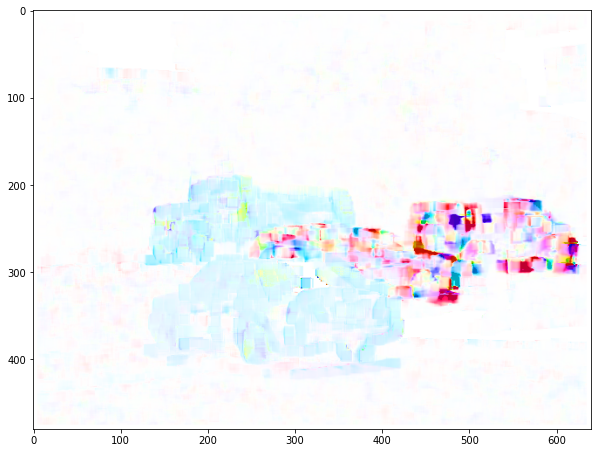

prefix path is  ./saved_data/Dumptruck/frame_7_window_size_11_avg_-1
hsv flow image being saved
Displaying the flow at corners only


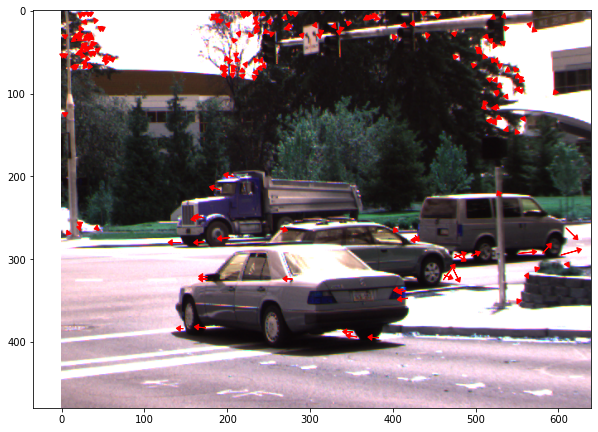

quiver plot saved


<Figure size 720x720 with 0 Axes>

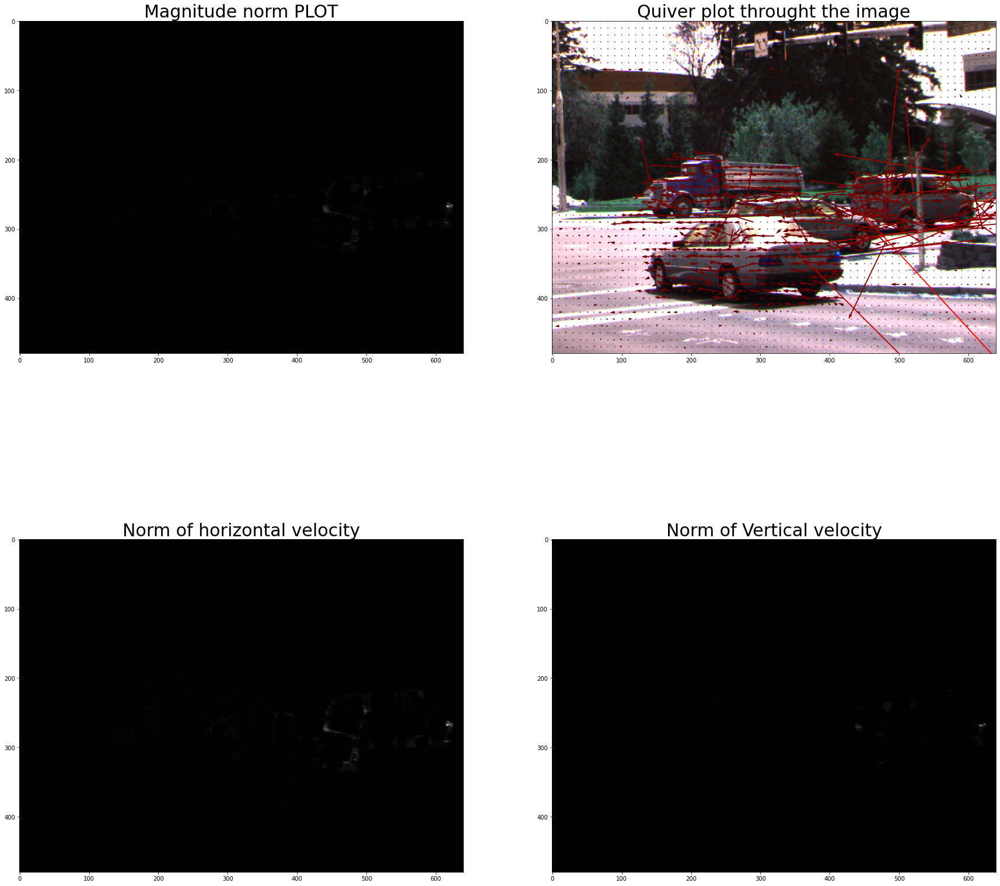

In [53]:
entire_pipeline('Dumptruck',7,14,window_sz=11, sum_mode='avg',recv_sigma_val=-1)

### Pyramidal : 3 levels and window size of 5

Picture category is  Dumptruck
WINDOW SIZE IS  5
Number of levels is  3
LK method applied
currently trying to find best estimate at level  3
currently trying to find best estimate at level  2
currently trying to find best estimate at level  1
currently trying to find best estimate at level  0
now refining at level: 0
img shape at level is  (60, 80)
now refining at level: 1
img shape at level is  (120, 160)
now refining at level: 2
img shape at level is  (240, 320)
now refining at level: 3
img shape at level is  (480, 640)


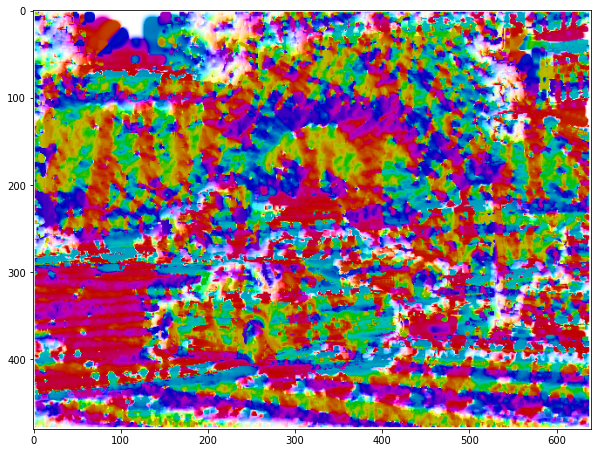

prefix path is  ./saved_data/Dumptruck/pyramidal_frame_7_window_size_5
hsv flow image being saved
Displaying the flow at corners only


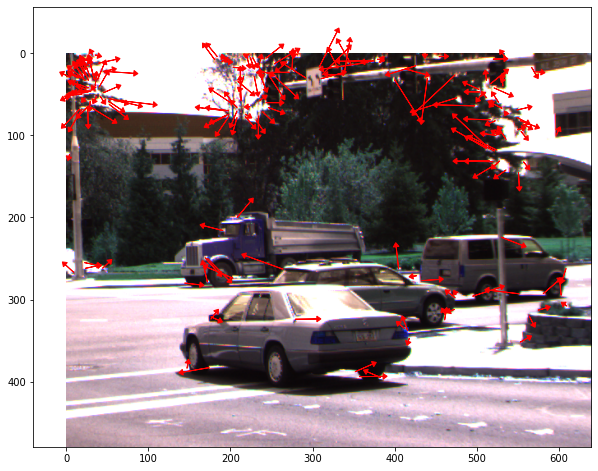

quiver plot saved
####################################


<Figure size 720x720 with 0 Axes>

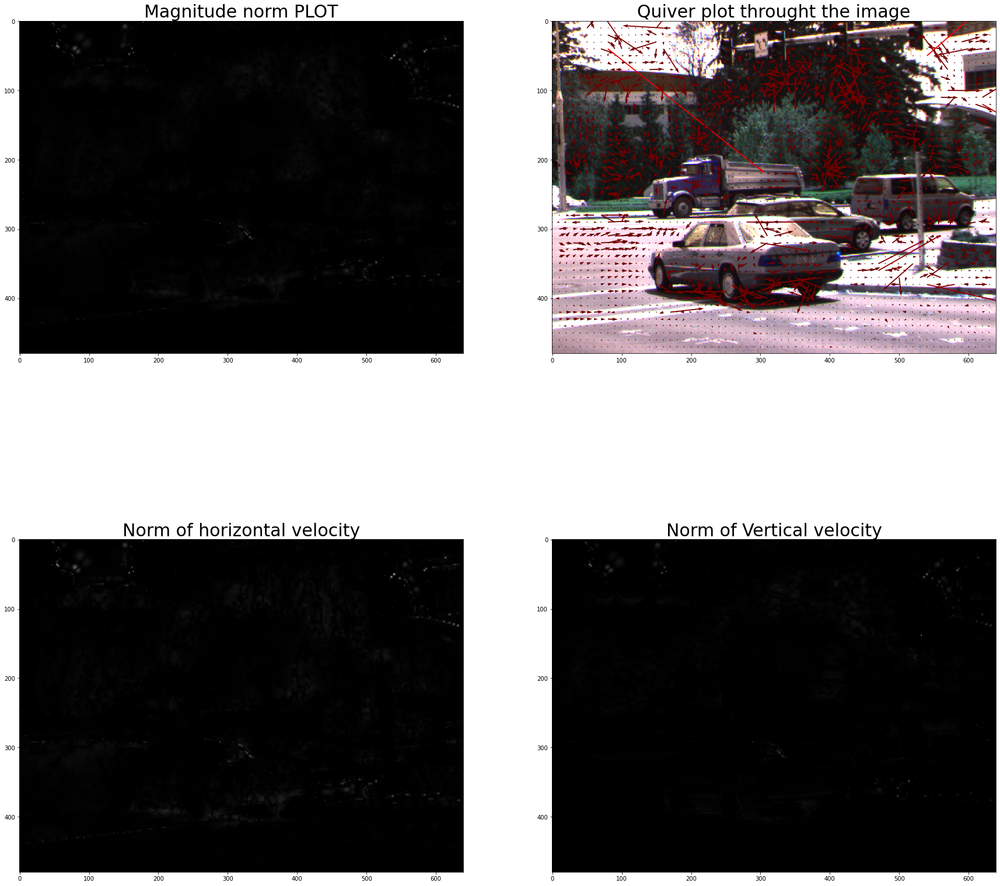

In [54]:
entire_pipeline_pyramidal('Dumptruck',7,14,window_sz=5, num_levels=3)

### Pyramidal : 5 levels and a window size of 5

Picture category is  Dumptruck
WINDOW SIZE IS  5
Number of levels is  5
LK method applied
currently trying to find best estimate at level  5
currently trying to find best estimate at level  4
currently trying to find best estimate at level  3
currently trying to find best estimate at level  2
currently trying to find best estimate at level  1
currently trying to find best estimate at level  0
now refining at level: 0
img shape at level is  (15, 20)
now refining at level: 1
img shape at level is  (30, 40)
now refining at level: 2
img shape at level is  (60, 80)
now refining at level: 3
img shape at level is  (120, 160)
now refining at level: 4
img shape at level is  (240, 320)
now refining at level: 5
img shape at level is  (480, 640)


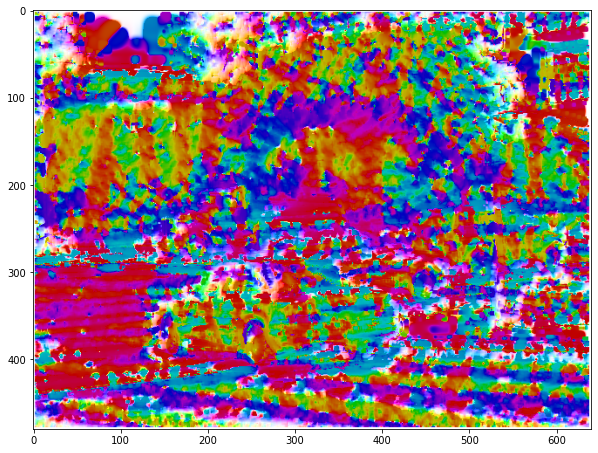

prefix path is  ./saved_data/Dumptruck/pyramidal_frame_7_window_size_5
hsv flow image being saved
Displaying the flow at corners only


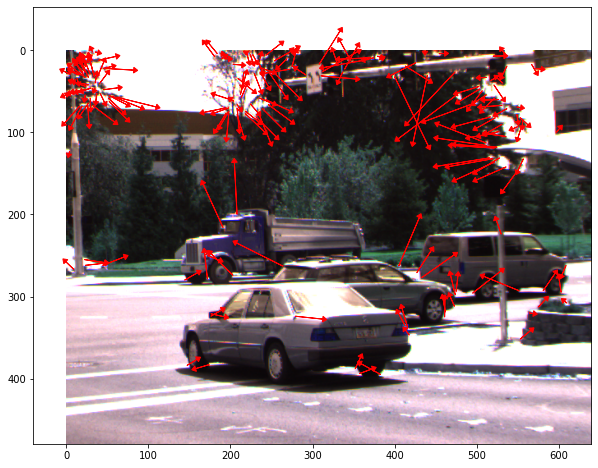

quiver plot saved
####################################


<Figure size 720x720 with 0 Axes>

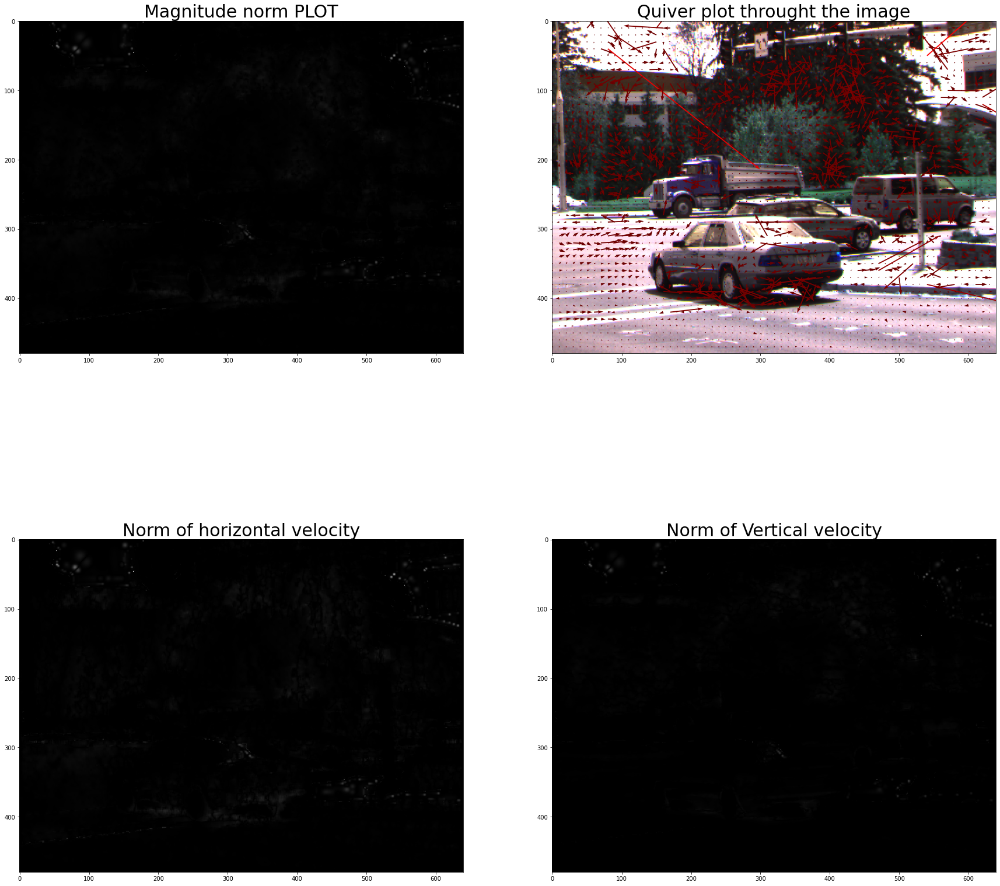

In [55]:
entire_pipeline_pyramidal('Dumptruck',7,14,window_sz=5, num_levels=5)

### Pyramidal : 2 levels and a window size of 5

Picture category is  Dumptruck
WINDOW SIZE IS  5
Number of levels is  2
LK method applied
currently trying to find best estimate at level  2
currently trying to find best estimate at level  1
currently trying to find best estimate at level  0
now refining at level: 0
img shape at level is  (120, 160)
now refining at level: 1
img shape at level is  (240, 320)
now refining at level: 2
img shape at level is  (480, 640)


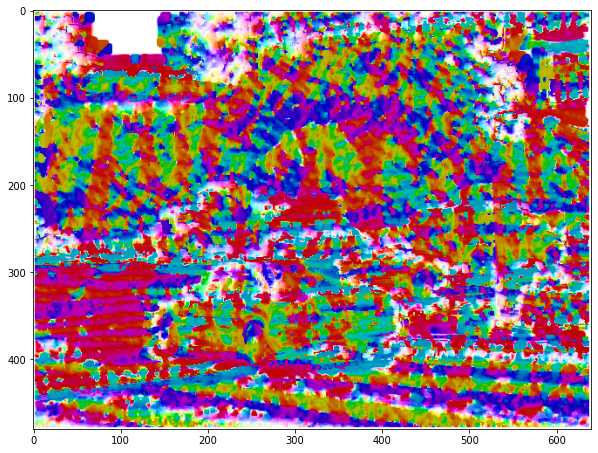

prefix path is  ./saved_data/Dumptruck/pyramidal_frame_7_window_size_5
hsv flow image being saved
Displaying the flow at corners only


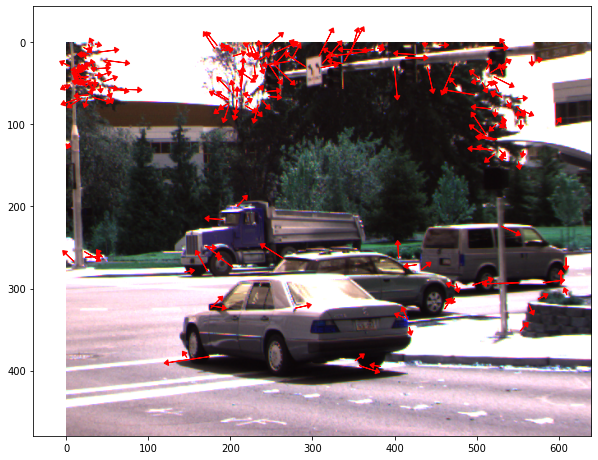

quiver plot saved
####################################


<Figure size 720x720 with 0 Axes>

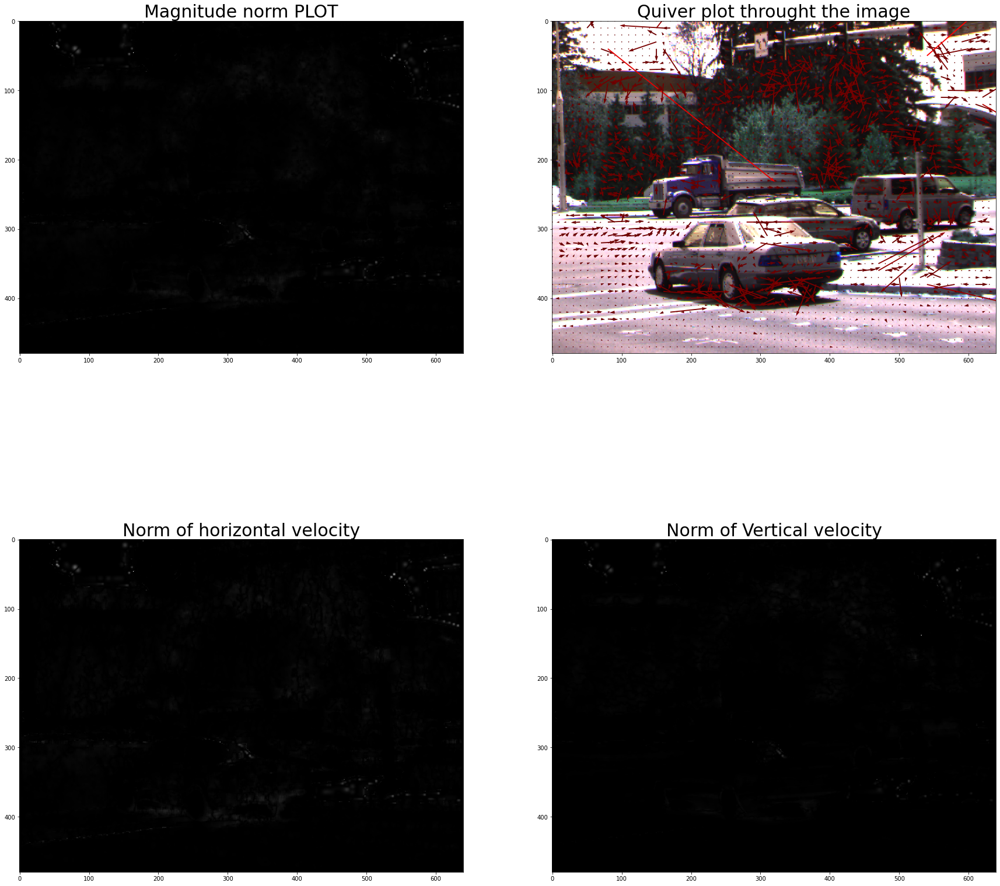

In [56]:
entire_pipeline_pyramidal('Dumptruck',7,14,window_sz=5, num_levels=2)

# pyramidal with window size=13 and levels=1

Picture category is  Dumptruck
WINDOW SIZE IS  13
Number of levels is  1
LK method applied
currently trying to find best estimate at level  1
currently trying to find best estimate at level  0
now refining at level: 0
img shape at level is  (240, 320)
now refining at level: 1
img shape at level is  (480, 640)


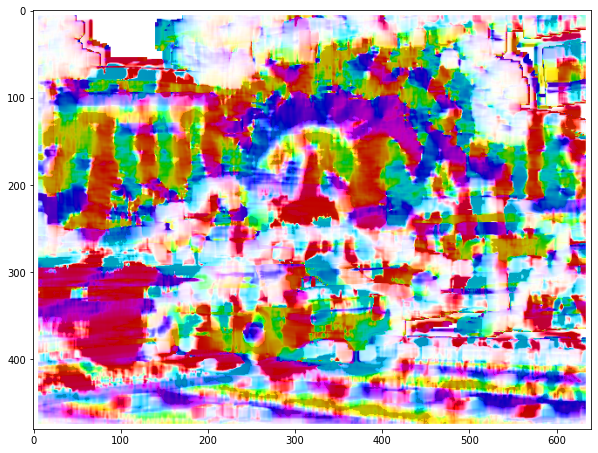

prefix path is  ./saved_data/Dumptruck/pyramidal_frame_7_window_size_13
hsv flow image being saved
Displaying the flow at corners only


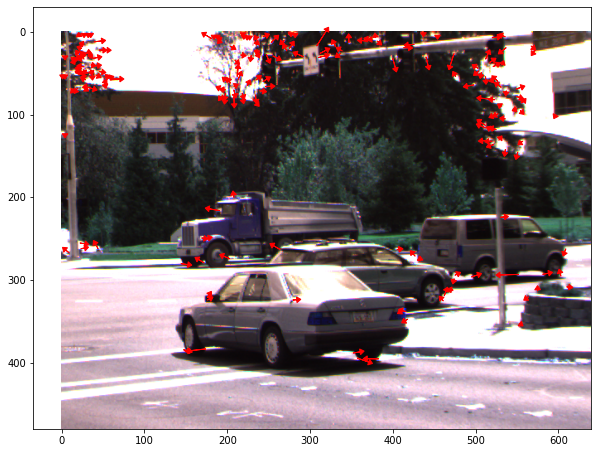

quiver plot saved
####################################


<Figure size 720x720 with 0 Axes>

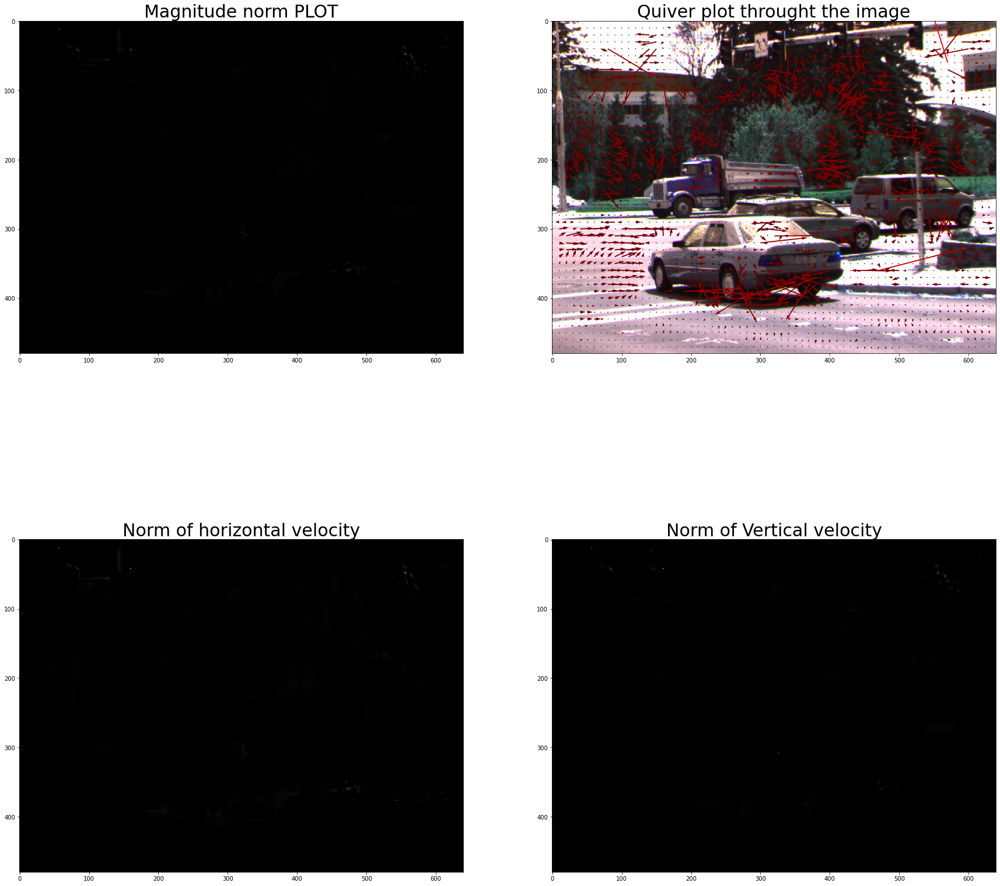

In [58]:
entire_pipeline_pyramidal('Dumptruck',7,14,window_sz=13, num_levels=1)

### Naive method

Picture category is  Urban2
WINDOW SIZE IS  5
Mode used to sum pixel contributions in the gradient covariance matrix is  avg
Sigma value being used (-1 in case MODE is NOT gaussian):  -1
LK method applied


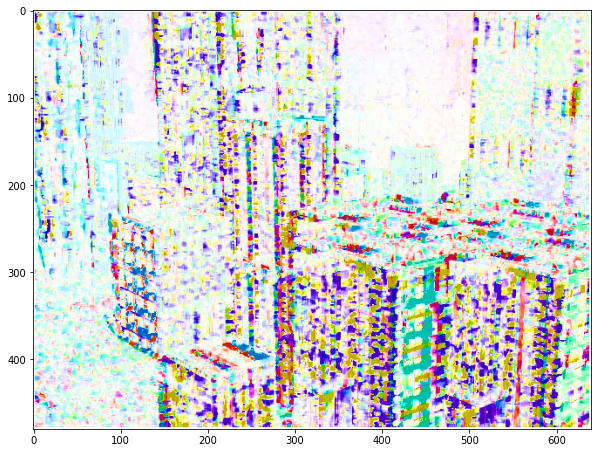

prefix path is  ./saved_data/Urban2/frame_7_window_size_5_avg_-1
hsv flow image being saved
Displaying the flow at corners only


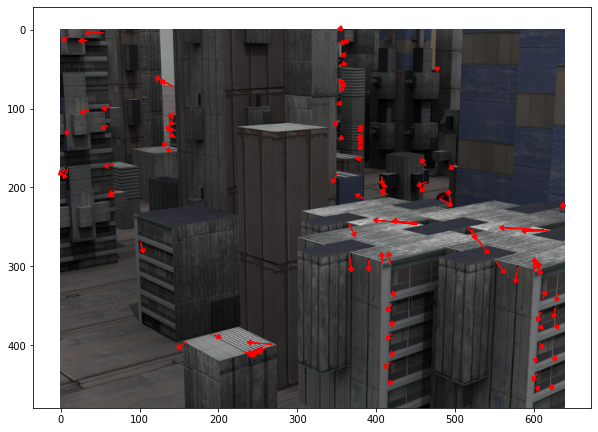

quiver plot saved


<Figure size 720x720 with 0 Axes>

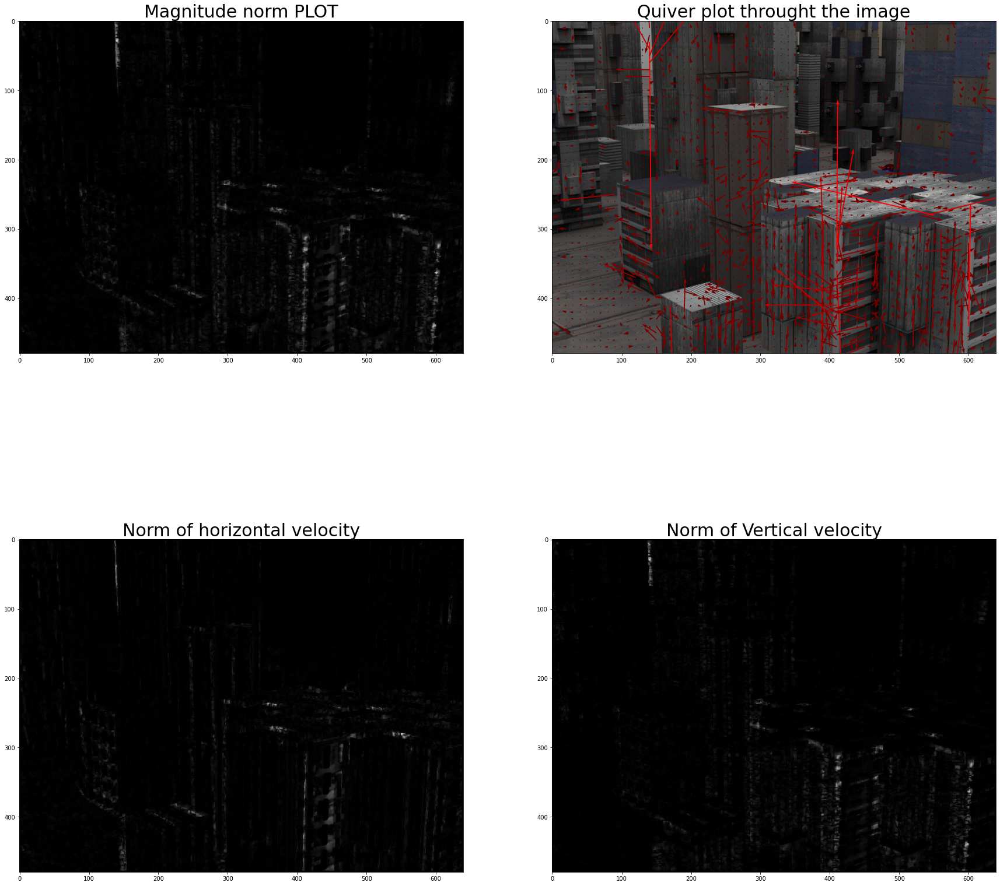

In [59]:
entire_pipeline('Urban2',7,14,window_sz=5, sum_mode='avg',recv_sigma_val=-1)

### Pyramidal (window=5, levels=2)

Picture category is  Urban2
WINDOW SIZE IS  5
Number of levels is  2
LK method applied
currently trying to find best estimate at level  2
currently trying to find best estimate at level  1
currently trying to find best estimate at level  0
now refining at level: 0
img shape at level is  (120, 160)
now refining at level: 1
img shape at level is  (240, 320)
now refining at level: 2
img shape at level is  (480, 640)


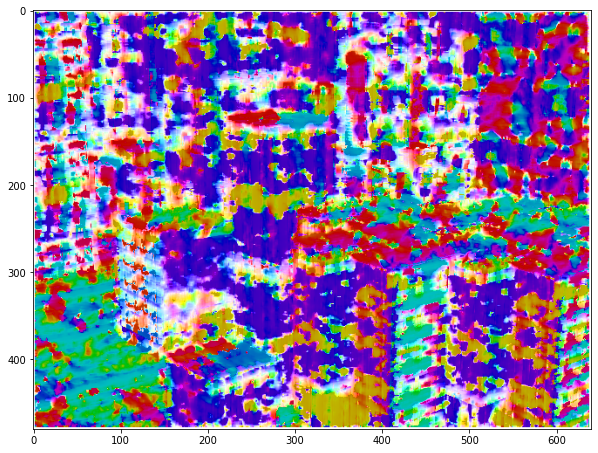

prefix path is  ./saved_data/Urban2/pyramidal_frame_7_window_size_5
hsv flow image being saved
Displaying the flow at corners only


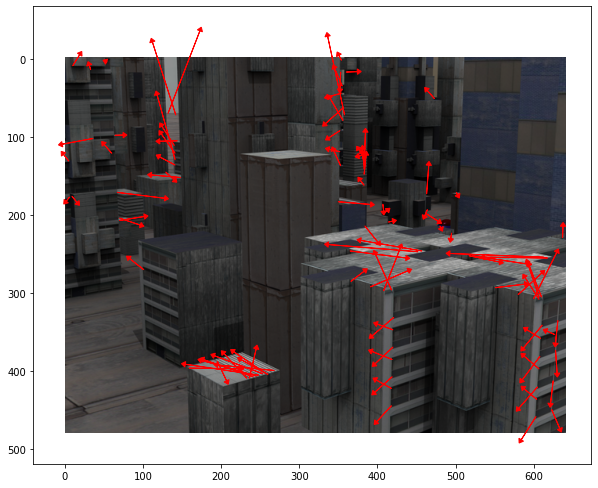

quiver plot saved
####################################


<Figure size 720x720 with 0 Axes>

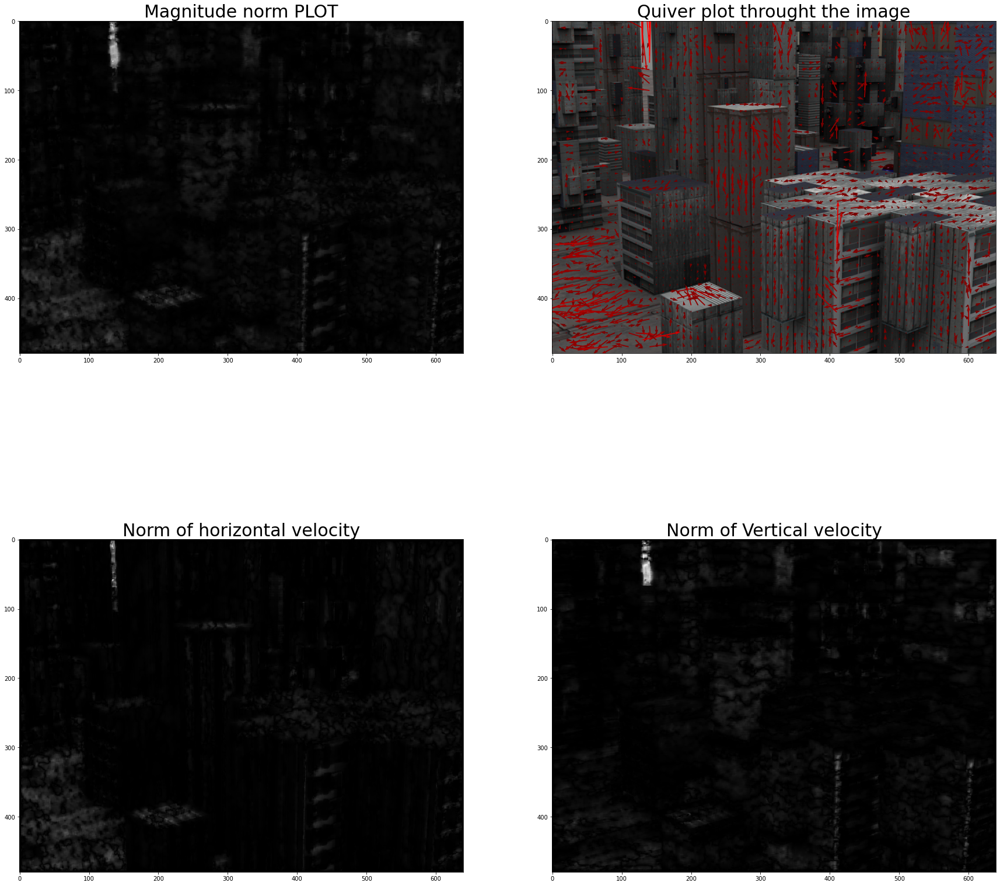

In [61]:
entire_pipeline_pyramidal('Urban2',7,14,window_sz=5, num_levels=2)

### Window=9, levels=4

Picture category is  Urban2
WINDOW SIZE IS  9
Number of levels is  4
LK method applied
currently trying to find best estimate at level  4
currently trying to find best estimate at level  3
currently trying to find best estimate at level  2
currently trying to find best estimate at level  1
currently trying to find best estimate at level  0
now refining at level: 0
img shape at level is  (30, 40)
now refining at level: 1
img shape at level is  (60, 80)
now refining at level: 2
img shape at level is  (120, 160)
now refining at level: 3
img shape at level is  (240, 320)
now refining at level: 4
img shape at level is  (480, 640)


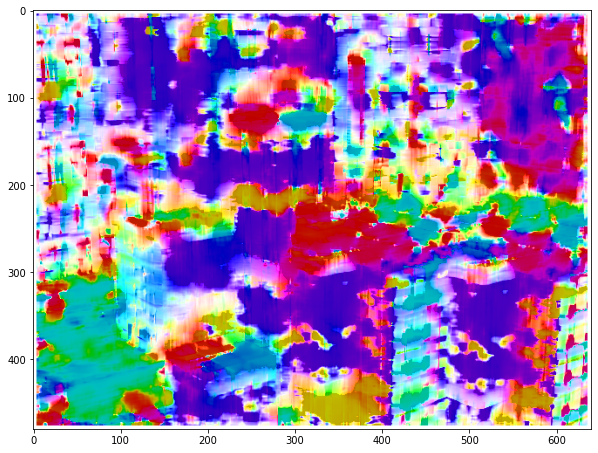

prefix path is  ./saved_data/Urban2/pyramidal_frame_7_window_size_9
hsv flow image being saved
Displaying the flow at corners only


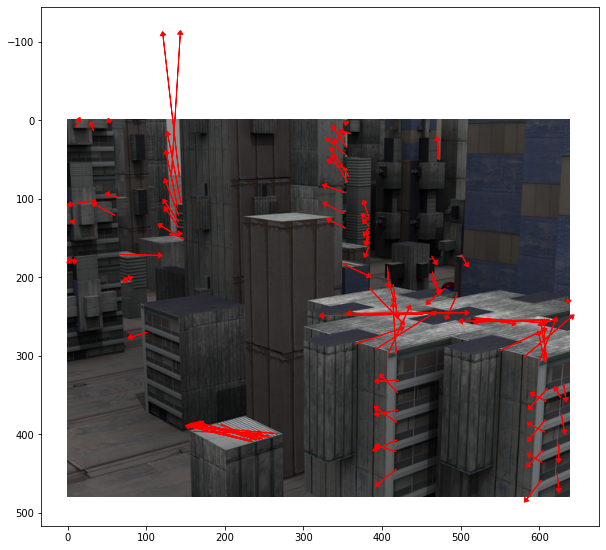

quiver plot saved
####################################


<Figure size 720x720 with 0 Axes>

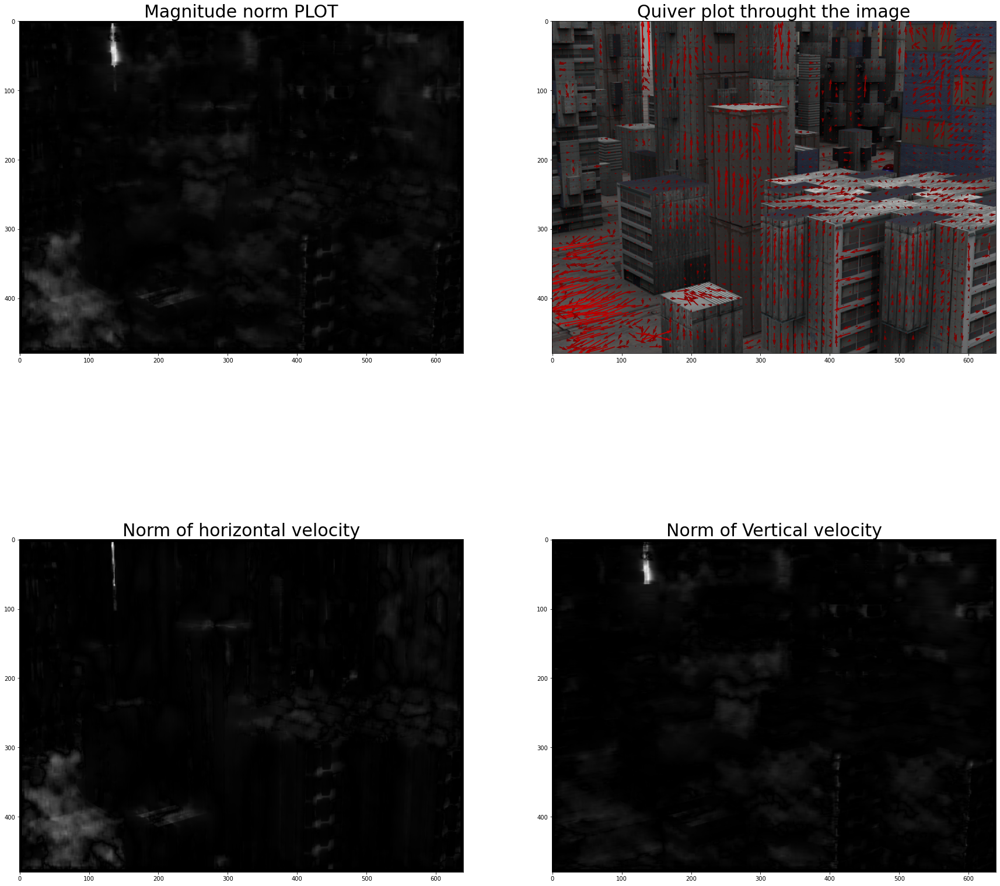

In [62]:
entire_pipeline_pyramidal('Urban2',7,14,window_sz=9, num_levels=4)